# Interpretability of Classifier Chain (Water Quality Dataset)

In [1]:
from IPython.display import display, HTML, Image

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import random

from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.model_selection import train_test_split

from sklearn.metrics import make_scorer
from sklearn import metrics

# to avoid future warnings for sklearn
import warnings
warnings.filterwarnings("ignore")

## Import the dataset

In [2]:
# Read the CSV file
dataset = pd.read_csv('water-quality.csv')
print("Dataset.shape: " + str(dataset.shape))

# split the features-X and class labels-y
X = dataset.iloc[:, :-14]
y = dataset.iloc[:, -14:]

print("X.shape: " + str(X.shape))
display(X.head())
print("y.shape: " + str(y.shape))
display(y.head())
print("Descriptive stats:")
X.describe()

Dataset.shape: (1060, 30)
X.shape: (1060, 16)


,std_temp,std_pH,conduct,o2,o2sat,co2,hardness,no2,no3,nh4,po4,cl,sio2,kmno4,k2cr2o7,bod
0,0.662303,23.722053,2.973241,5.343706,4.446809,0.000000,3.546433,0.403047,2.362222,0.232044,0.189460,1.459533,1.663324,1.026990,0.841600,0.203596
1,2.025867,23.722053,3.298439,4.100984,4.072903,0.155396,3.388814,0.345469,2.178153,0.210949,0.526279,1.739018,2.217765,0.837808,0.712491,0.150484
2,3.253074,23.421773,2.740956,3.645319,4.157477,0.699283,2.955361,0.460625,3.098499,0.097036,0.315767,0.776347,3.188038,0.851321,0.707709,0.247856
3,3.759541,24.022332,2.657334,3.231078,3.877047,0.000000,3.034170,6.966957,1.932727,0.147664,0.210512,0.817753,2.633596,0.918886,0.736400,0.416043
4,1.928469,23.121494,2.332136,4.515224,4.429004,0.699283,3.112980,0.633360,2.147475,0.189854,0.357870,1.076535,2.598944,0.851321,0.827255,0.345227


y.shape: (1060, 14)


,Label1,Label2,Label3,Label4,Label5,Label6,Label7,Label8,Label9,Label10,Label11,Label12,Label13,Label14
0,1,0,0,0,0,1,1,0,1,1,1,1,1,1
1,0,1,0,1,1,1,1,0,1,1,1,1,1,0
2,1,1,0,0,1,0,1,0,1,1,1,0,1,1
3,1,1,0,0,1,1,1,1,1,1,1,1,0,0
4,0,0,1,0,0,1,0,0,1,0,0,1,0,1


Descriptive stats:


,std_temp,std_pH,conduct,o2,o2sat,co2,hardness,no2,no3,nh4,po4,cl,sio2,kmno4,k2cr2o7,bod
count,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000,1060.000000
mean,2.464376,24.170205,3.073956,4.370396,4.509492,0.397726,4.034421,0.463015,1.569769,0.265489,0.294657,0.603969,1.223007,0.581876,0.544428,0.349620
std,1.059541,0.966318,1.037480,1.045264,1.024500,1.009108,1.054268,0.957149,1.052141,0.872142,0.743339,0.643723,0.956059,0.875774,0.750472,0.544120
min,0.058438,21.019540,0.966303,0.041424,0.048964,0.000000,1.694407,0.000000,0.000000,0.012657,0.000000,0.062108,0.069305,0.013513,0.062164,0.017704
25%,1.636277,23.421773,2.406467,3.893863,4.141897,0.000000,3.349409,0.057578,0.920346,0.046409,0.042102,0.238080,0.554441,0.256748,0.205618,0.115076
50%,2.405717,24.322611,2.950012,4.473800,4.553639,0.000000,3.940481,0.172734,1.395858,0.084379,0.105256,0.372647,0.970272,0.351339,0.349073,0.185892
75%,3.233595,24.923169,3.560921,4.970889,4.976508,0.427340,4.689172,0.403047,2.055440,0.147664,0.273665,0.745294,1.559366,0.624978,0.635982,0.354079
max,5.356859,27.925961,12.422572,8.491936,10.580645,9.556867,9.930012,8.751880,18.805741,17.086844,12.314930,6.562724,6.618643,19.107427,14.967098,7.081589


## Check the shape of data

In [3]:
# Normalise the data
X = (X-X.min())/(X.max()-X.min())

# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, train_size=0.7)

print("X_train.shape: " + str(X_train.shape))
print("X_test.shape: " + str(X_test.shape))
print("y_train.shape: " + str(y_train.shape))
print("y_test.shape: " + str(y_test.shape))

X_train.shape: (742, 16)
X_test.shape: (318, 16)
y_train.shape: (742, 14)
y_test.shape: (318, 14)


## Classifier Chain

In [4]:
from sklearn.multioutput import ClassifierChain

### Fit the classifier(with RandomForestClassifier)

In [5]:
chain_clf = ClassifierChain(RandomForestClassifier(criterion='entropy'), order='random', random_state=0)
chain_clf.fit(X_train, y_train)

ClassifierChain(base_estimator=RandomForestClassifier(criterion='entropy'),
                order='random', random_state=0)

### Prediction

In [6]:
pred_chain=chain_clf.predict(X_test)

In [7]:
print(type(pred_chain))

<class 'numpy.ndarray'>


In [18]:
pred_chain_df=pd.DataFrame(pred_chain,columns=y.columns.tolist())
pred_chain_df

,Label1,Label2,Label3,Label4,Label5,Label6,Label7,Label8,Label9,Label10,Label11,Label12,Label13,Label14
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
314,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
315,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
316,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


### predict_proba function

In [11]:
pred_chain_proba=chain_clf.predict_proba(X_test)

In [15]:
print(type(pred_chain_proba))

<class 'numpy.ndarray'>


In [19]:
pred_chain_proba_df=pd.DataFrame(pred_chain_proba,columns=y.columns.tolist())

In [20]:
pred_chain_proba_df

,Label1,Label2,Label3,Label4,Label5,Label6,Label7,Label8,Label9,Label10,Label11,Label12,Label13,Label14
0,0.07,0.12,0.04,0.00,0.02,0.02,0.08,0.02,0.65,0.36,0.10,0.76,0.10,0.09
1,0.17,0.17,0.66,0.05,0.02,0.18,0.07,0.24,0.42,0.15,0.47,0.44,0.18,0.13
2,0.10,0.10,0.12,0.08,0.12,0.02,0.09,0.01,0.14,0.26,0.28,0.68,0.38,0.02
3,0.19,0.46,0.37,0.34,0.27,0.70,0.11,0.42,0.46,0.27,0.23,0.02,0.33,0.63
4,0.55,0.25,0.07,0.18,0.56,0.53,0.31,0.15,0.74,0.48,0.44,0.44,0.35,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,0.24,0.14,0.02,0.02,0.02,0.04,0.17,0.01,0.54,0.18,0.14,0.80,0.18,0.08
314,0.23,0.29,0.14,0.26,0.63,0.50,0.13,0.31,0.58,0.28,0.20,0.23,0.31,0.45
315,0.70,0.29,0.50,0.15,0.62,0.65,0.40,0.58,0.56,0.35,0.62,0.20,0.24,0.32
316,0.42,0.17,0.32,0.24,0.27,0.58,0.30,0.38,0.41,0.13,0.25,0.14,0.22,0.56


### Calculate multioutput precision and loss

In [12]:
# calculate multioutput precision and loss
from sklearn.metrics import label_ranking_average_precision_score, label_ranking_loss

In [13]:
avg_precision = label_ranking_average_precision_score(y_test, pred_chain)
loss = label_ranking_loss(y_test, pred_chain)

In [14]:
# Get precision and loss
print('Average precision {0:.5f} and loss {1:.5f}'.format(avg_precision, loss))

Average precision 0.53641 and loss 0.58559


## Explain the model with SHAP

### Import SHAP

In [17]:
# Load ML Interpreting Models
import shap

# Initialize JS For Plot
shap.initjs()

### Build explainer(predict_proba function works)

In [18]:
explainer_chain = shap.KernelExplainer(chain_clf.predict_proba, X_train)

Using 742 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


## Local Interpretability

### Calculate shap_values of first row of X_test

In [19]:
shap_values = explainer_chain.shap_values(X_test.iloc[0,:])

### Visualize the shap value, here is the explanation of X_test.iloc[0,:] about label 1

In [20]:
shap.force_plot(explainer_chain.expected_value[0], shap_values[0], X_test.iloc[0,:])

### The explanation of X_test.iloc[0,:] about label 2

In [21]:
shap.force_plot(explainer_chain.expected_value[1], shap_values[1], X_test.iloc[0,:])

### The explanation of X_test.iloc[0,:] about label 3

In [22]:
shap.force_plot(explainer_chain.expected_value[2], shap_values[2], X_test.iloc[0,:])

### Calculate shap_values of second row of X_test

In [23]:
shap_values = explainer_chain.shap_values(X_test.iloc[1,:])

### The explanation of X_test.iloc[1,:] about label 1

In [24]:
shap.force_plot(explainer_chain.expected_value[0], shap_values[0], X_test.iloc[1,:])

### The explanation of X_test.iloc[1,:] about label 2

In [25]:
shap.force_plot(explainer_chain.expected_value[1], shap_values[1], X_test.iloc[1,:])

### The explanation of X_test.iloc[1,:] about label 3

In [26]:
shap.force_plot(explainer_chain.expected_value[2], shap_values[2], X_test.iloc[1,:])

## Use the K-Means Algorithm to summarize the data otherwise it wil take too much time (a few hours)to complete all the calculation. But on the other hand we will lose some accuracy.

In [30]:
# using kmeans
X_train_summary = shap.kmeans(X_train, 10)

### Build the explainer

In [31]:
explainer_chain = shap.KernelExplainer(chain_clf.predict_proba, X_train_summary)

### Get the KNN shap value of X_test

In [33]:
shap_values_KNN_test = explainer_chain.shap_values(X_test)

### Summerize the explanations of predictions about Label 1

In [34]:
shap.force_plot(explainer_chain.expected_value[0], shap_values_KNN_test[0], X_test)

### Summerize the explanations of predictions about Label 2

In [35]:
shap.force_plot(explainer_chain.expected_value[1], shap_values_KNN_test[1], X_test)

### Summerize the explanations of predictions about Label 3

In [36]:
shap.force_plot(explainer_chain.expected_value[2], shap_values_KNN_test[2], X_test)

### Summerize the explanations of predictions about Label 4

In [37]:
shap.force_plot(explainer_chain.expected_value[3], shap_values_KNN_test[3], X_test)

### Summerize the explanations of predictions about Label 5

In [38]:
shap.force_plot(explainer_chain.expected_value[4], shap_values_KNN_test[4], X_test)

## Bar chart of feature Importance

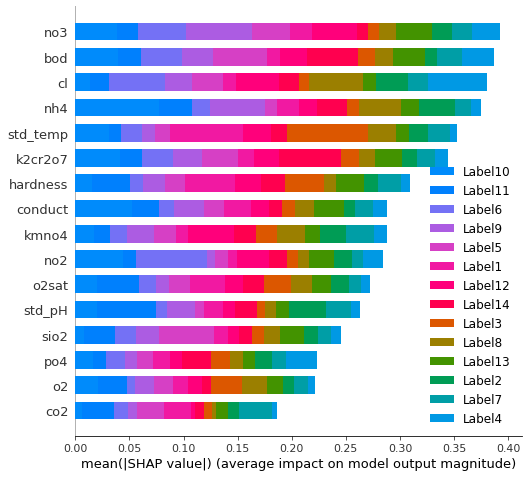

In [39]:
shap.summary_plot(shap_values_KNN_test, X, plot_type="bar",class_names = y.columns.tolist())

#### There are some small differences between bar chart of Chain Classifier and Multi-Output Classifier.

## SHAP also indicates how each feature impacts the dependent variable.

## How each feature impacts Label 1

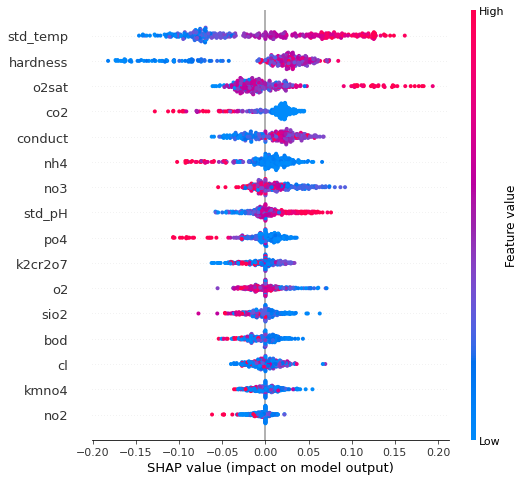

In [41]:
shap.summary_plot(shap_values_KNN_test[0], X_test)

### How each feature impacts Label 2

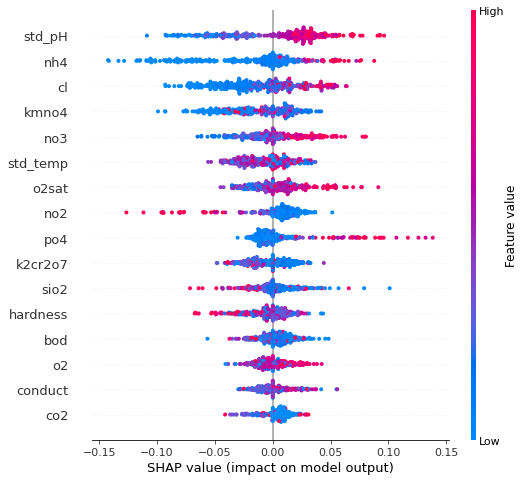

In [42]:
shap.summary_plot(shap_values_KNN_test[1], X_test)

### How each feature impacts Label 3

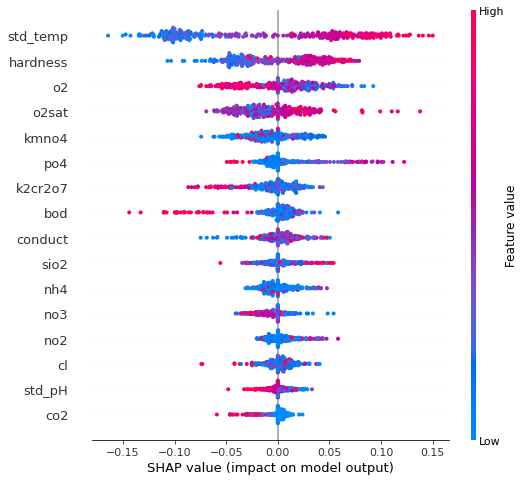

In [43]:
shap.summary_plot(shap_values_KNN_test[2], X_test)

### How each feature impacts Label 4

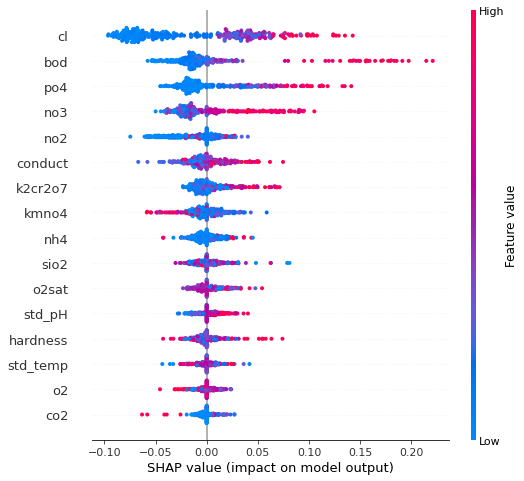

In [44]:
shap.summary_plot(shap_values_KNN_test[3], X_test)

# Global Interpretability

### From the bar chart of feature importance we know that no3, bod, cl, nh4...have the most influences on predictions. So I pick them as example of this part.

### Feature "no3" on Label 1

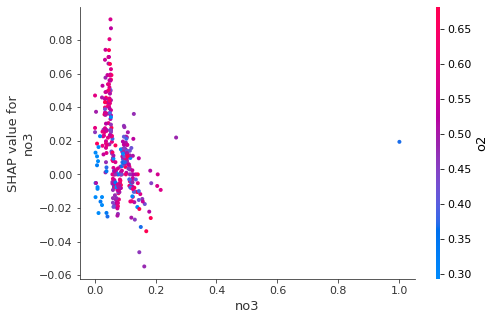

In [45]:
shap.dependence_plot("no3", shap_values_KNN_test[0], X_test)

#### The output above is similar to Multi-Output Classifier about no3 with label 1.

### Feature "no3" on Label 12

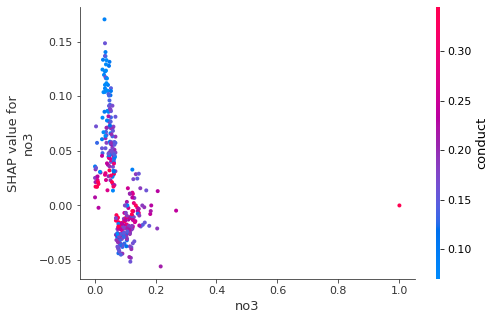

In [46]:
shap.dependence_plot("no3", shap_values_KNN_test[11], X_test)

### Feature "no3" on Label 9

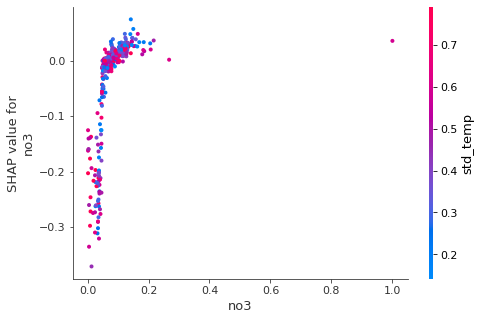

In [47]:
shap.dependence_plot("no3", shap_values_KNN_test[8], X_test)

#### The output above is also similar to Multi-Output Classifier about no3 with label 9.

### Feature "bod" on Label 10

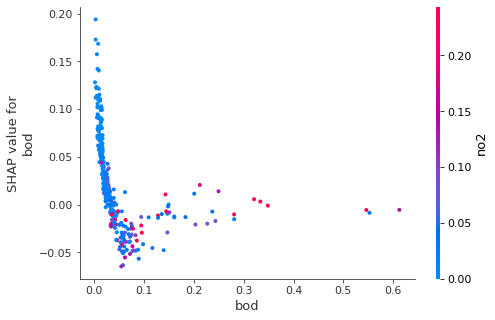

In [48]:
shap.dependence_plot("bod", shap_values_KNN_test[9], X_test)

### Feature "bod" on Label 5

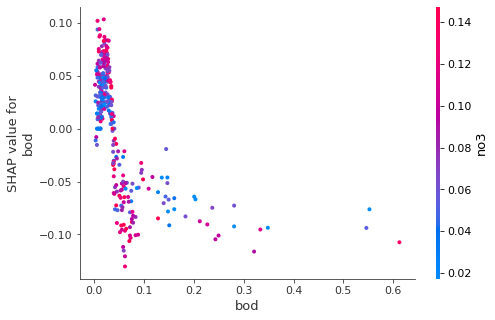

In [49]:
shap.dependence_plot("bod", shap_values_KNN_test[4], X_test)

### Feature "bod" on Label 14

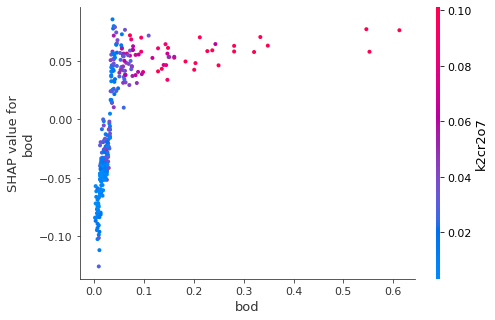

In [51]:
shap.dependence_plot("bod", shap_values_KNN_test[13], X_test)

### Feature "cl" on Label 4

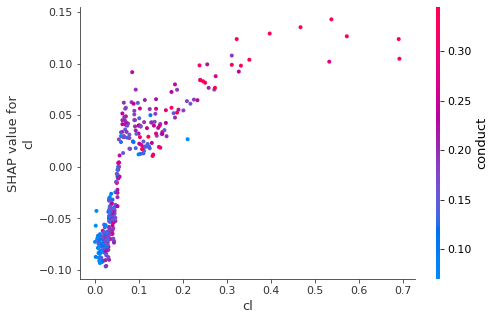

In [52]:
shap.dependence_plot("cl", shap_values_KNN_test[3], X_test)

### Feature "cl" on Label 6

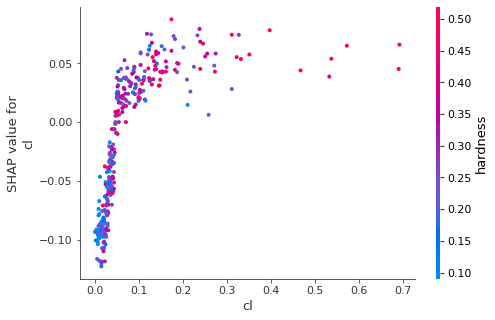

In [53]:
shap.dependence_plot("cl", shap_values_KNN_test[5], X_test)

### Feature "cl" on Label 12

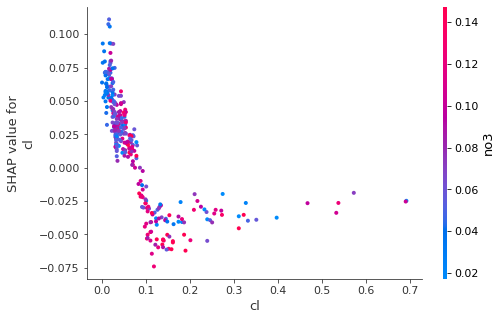

In [54]:
shap.dependence_plot("cl", shap_values_KNN_test[11], X_test)

## What's more, the predict function of this classifier is also interpretable with SHAP

### Build the explainer

In [69]:
explainer_chain2 = shap.KernelExplainer(chain_clf.predict, X_train)

Using 742 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


### Calculate SHAP values of the first row of X_test(Sample 1)

In [70]:
shap_values2 = explainer_chain2.shap_values(X_test.iloc[0,:])

### Explanation of Sample 1 for Label 1

In [71]:
shap.force_plot(explainer_chain2.expected_value[0], shap_values2[0], X_test.iloc[0,:])

### Explanation of Sample 1 for Label 2

In [72]:
shap.force_plot(explainer_chain2.expected_value[1], shap_values2[1], X_test.iloc[0,:])

### Calculate SHAP values of the second row of X_test (Sample 2)

In [73]:
shap_values2 = explainer_chain2.shap_values(X_test.iloc[1,:])

### Explanation of Sample 2 for Label 1

In [75]:
shap.force_plot(explainer_chain2.expected_value[0], shap_values2[0], X_test.iloc[1,:])

### Explanation of Sample 2 for Label 2

In [76]:
shap.force_plot(explainer_chain2.expected_value[1], shap_values2[1], X_test.iloc[1,:])

## The next steps are similar to the previous explanation of the predict-proba function.

# Explain with LIME

## Import LIME

In [56]:
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)


In [58]:
# Creating the Lime Explainer
# Be very careful in setting the order of the class names
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="lasso_path",
    class_names=["Label1","Label2","Label3","Label4","Label5","Label6","Label7","Label8","Label9","Label10","Label11","Label12","Label13","Label14"],
    discretize_continuous=True,
    discretizer="entropy",
)

## Use LIME to explain predict_proba function of our Chain Classifier.

In [59]:
#Now let's pick a sample case from our test set.
row = 10
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict_proba, num_features=16)
exp.show_in_notebook(show_table=True)

In [61]:
#Now let's pick a sample case from our test set.
row = 36
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict_proba, num_features=16)
exp.show_in_notebook(show_table=True)

In [62]:
#Now let's pick a sample case from our test set.
row = 100
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict_proba, num_features=16)
exp.show_in_notebook(show_table=True)

### Predict function of this classifier is also interpretable.

In [63]:
#Now let's pick a sample case from our test set.
row = 10
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict, num_features=16)
exp.show_in_notebook(show_table=True)

In [64]:
row = 36
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict, num_features=16)
exp.show_in_notebook(show_table=True)

In [65]:
row = 100
exp = lime_explainer.explain_instance(X_test.iloc[row], chain_clf.predict, num_features=16)
exp.show_in_notebook(show_table=True)

### There are similar output of explainers of predict_proba function and predict function.

# Explain with eli5(Permutation Feature Importance)

## Import eli5

In [66]:
import eli5
from eli5.sklearn import PermutationImportance

In [67]:
perms_chain = PermutationImportance(chain_clf).fit(X_test, y_test)

In [68]:
eli5.show_weights(perms_chain,top=16,feature_names = X.columns.tolist())

Weight,Feature
0.0107 ± 0.0085,no3
0.0044 ± 0.0085,nh4
0.0038 ± 0.0025,sio2
0.0038 ± 0.0062,o2
0.0031 ± 0.0040,o2sat
0.0025 ± 0.0073,conduct
0.0013 ± 0.0031,kmno4
0.0013 ± 0.0064,std_temp
0.0006 ± 0.0025,k2cr2o7
0.0006 ± 0.0047,hardness


### The output is too brief. We cannot see the specific influences of the features on different labels.